Your file on your github needs to be a a .ipynb file with the first four letters of one first name, the first four letters of one last name, and U6proj.

Ex1.

A student named Avy Aguacate Avocado Palta will submit a file named "Avy_AvocU8proj.ipynb", since she normally just goes by Avy, and, when pressed, reports Avocado as her last name. The " _ " after "Avy" serves as the fourth "letter" in her first name.

Ex2.

Army Armadillo will submit a file named "ArmyArmaU8proj.ipynb"

In [2]:
!pip install pymc-bart
!pip install preliz

  Using cached preliz-0.16.0-py3-none-any.whl.metadata (6.1 kB)
Using cached preliz-0.16.0-py3-none-any.whl (519 kB)


In [4]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import pymc_bart as pmb
import preliz as pz
import seaborn as sns

In [3]:
import preliz as pz

# Unit 8 Project: Writing a BARTical

**Task**:

Two parts:

1. Propose a data set that's compatible with a pymc_bart model. I must approve your submission before you move on to part 2.

2. Create, analyze, and present BART model, using pymc_bart within the colab environment, on a data set of your choice, with the following conditions:
  - your final model must have more than 2 predictors. The intercept term doesn't count as a predictor here (even though technically it is)
  - You must argue why your variable selection is justified. You may use either a theoretical or numerical argument. Additionally, you must comment on any potential interactions between your predictor variables.



# Introduction

I found this data set on kaggle that looked at advanced statistics for all Division 1 College Basketball teams over the last couple years and thought that it would be interesting to look at. In College Basketball the National Champion is decided in a tournament nicknamed March Madness. It is a 64 team single loss elimination tournament where the last team standing gets crowned National Champion. Teams are selected for this tournament based on their performance throughout the regular season and are seeded 1 through 16. There are four of each seed. So, 16 * 4 = 64.

In [5]:
url="https://raw.githubusercontent.com/vincewilliams1101/DataScience/refs/heads/main/cbb.csv"
cbb = pd.read_csv(url)
cbb

,TEAM,CONF,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,...,FTRD,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,POSTSEASON,SEED,YEAR
0,North Carolina,ACC,40,33,123.3,94.9,0.9531,52.6,48.1,15.4,...,30.4,53.9,44.6,32.7,36.2,71.7,8.6,2ND,1.0,2016
1,Wisconsin,B10,40,36,129.1,93.6,0.9758,54.8,47.7,12.4,...,22.4,54.8,44.7,36.5,37.5,59.3,11.3,2ND,1.0,2015
2,Michigan,B10,40,33,114.4,90.4,0.9375,53.9,47.7,14.0,...,30.0,54.7,46.8,35.2,33.2,65.9,6.9,2ND,3.0,2018
3,Texas Tech,B12,38,31,115.2,85.2,0.9696,53.5,43.0,17.7,...,36.6,52.8,41.9,36.5,29.7,67.5,7.0,2ND,3.0,2019
4,Gonzaga,WCC,39,37,117.8,86.3,0.9728,56.6,41.1,16.2,...,26.9,56.3,40.0,38.2,29.0,71.5,7.7,2ND,1.0,2017
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3880,Stonehill,NEC,30,4,90.3,114.2,0.0629,46.7,52.7,19.5,...,29.4,47.9,51.7,30.1,35.9,68.1,-22.0,NaN,NaN,2024
3881,St. Francis PA,NEC,28,8,93.1,118.1,0.0608,47.2,53.0,21.2,...,35.4,45.7,52.9,33.2,35.4,65.4,-18.6,NaN,NaN,2024
3882,IUPUI,Horz,29,6,92.1,116.9,0.0607,46.5,58.2,21.3,...,33.4,49.5,59.0,24.7,38.0,67.3,-21.6,NaN,NaN,2024
3883,Coppin St.,MEAC,29,2,85.1,111.1,0.0445,42.1,51.3,22.9,...,38.3,41.9,51.0,28.3,34.5,66.3,-22.9,NaN,NaN,2024


# Fixing My Data
This dataset includes teams that didn't make the tournament meaning they didn't get a seed between 1 and 16, so I had to remove them from my dataset so that my model would run.

In [7]:
cbb = cbb[(cbb['SEED'] <= 16) & (cbb['SEED'] >= 1)]
cbb

,TEAM,CONF,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,...,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,POSTSEASON,SEED,YEAR,ADJE
0,North Carolina,ACC,40,33,123.3,94.9,0.9531,52.6,48.1,15.4,...,53.9,44.6,32.7,36.2,71.7,8.6,2ND,1.0,2016,28.4
1,Wisconsin,B10,40,36,129.1,93.6,0.9758,54.8,47.7,12.4,...,54.8,44.7,36.5,37.5,59.3,11.3,2ND,1.0,2015,35.5
2,Michigan,B10,40,33,114.4,90.4,0.9375,53.9,47.7,14.0,...,54.7,46.8,35.2,33.2,65.9,6.9,2ND,3.0,2018,24.0
3,Texas Tech,B12,38,31,115.2,85.2,0.9696,53.5,43.0,17.7,...,52.8,41.9,36.5,29.7,67.5,7.0,2ND,3.0,2019,30.0
4,Gonzaga,WCC,39,37,117.8,86.3,0.9728,56.6,41.1,16.2,...,56.3,40.0,38.2,29.0,71.5,7.7,2ND,1.0,2017,31.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3586,Montana St.,BSky,31,17,102.9,105.8,0.4193,53.9,52.3,16.8,...,53.4,54.1,36.4,32.6,68.5,-12.6,R68,16.0,2024,-2.9
3587,Stetson,ASun,31,22,108.3,114.0,0.3559,53.4,52.0,15.8,...,52.5,52.2,36.5,34.5,66.0,-6.8,R64,16.0,2024,-5.7
3588,Howard,MEAC,32,18,104.5,112.9,0.2913,52.0,50.9,21.4,...,49.2,50.8,37.5,34.0,67.7,-12.1,R68,16.0,2024,-8.4
3589,Grambling St.,SWAC,31,20,97.7,106.0,0.2805,48.2,49.1,20.5,...,47.0,48.4,34.1,33.7,64.9,-8.0,R64,16.0,2024,-8.3


In [8]:
cbb['ADJE'] = (cbb.ADJOE - cbb.ADJDE)

<ipython-input-8-24c6c575b0e4>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cbb['ADJE'] = (cbb.ADJOE - cbb.ADJDE)


# ADJE
I wanted to find a piece of data that represents how well a team is overall. ADJOE or adjusted offensive efficiency represents how well a team does on offense per 100 possessions. ADJDE or adjusted defensive efficiency represents how well a team does on defense per 100 defensive possessions. I made my own piece of data that is called ADJE or adjusted efficiency which is ADJOE - ADJDE. This gives me a good idea of how good a team is overall. The higher the ADJE the better a team is on offense and defense meaning I can find the best overall team.

In [9]:
cbb

,TEAM,CONF,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,...,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,POSTSEASON,SEED,YEAR,ADJE
0,North Carolina,ACC,40,33,123.3,94.9,0.9531,52.6,48.1,15.4,...,53.9,44.6,32.7,36.2,71.7,8.6,2ND,1.0,2016,28.4
1,Wisconsin,B10,40,36,129.1,93.6,0.9758,54.8,47.7,12.4,...,54.8,44.7,36.5,37.5,59.3,11.3,2ND,1.0,2015,35.5
2,Michigan,B10,40,33,114.4,90.4,0.9375,53.9,47.7,14.0,...,54.7,46.8,35.2,33.2,65.9,6.9,2ND,3.0,2018,24.0
3,Texas Tech,B12,38,31,115.2,85.2,0.9696,53.5,43.0,17.7,...,52.8,41.9,36.5,29.7,67.5,7.0,2ND,3.0,2019,30.0
4,Gonzaga,WCC,39,37,117.8,86.3,0.9728,56.6,41.1,16.2,...,56.3,40.0,38.2,29.0,71.5,7.7,2ND,1.0,2017,31.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3586,Montana St.,BSky,31,17,102.9,105.8,0.4193,53.9,52.3,16.8,...,53.4,54.1,36.4,32.6,68.5,-12.6,R68,16.0,2024,-2.9
3587,Stetson,ASun,31,22,108.3,114.0,0.3559,53.4,52.0,15.8,...,52.5,52.2,36.5,34.5,66.0,-6.8,R64,16.0,2024,-5.7
3588,Howard,MEAC,32,18,104.5,112.9,0.2913,52.0,50.9,21.4,...,49.2,50.8,37.5,34.0,67.7,-12.1,R68,16.0,2024,-8.4
3589,Grambling St.,SWAC,31,20,97.7,106.0,0.2805,48.2,49.1,20.5,...,47.0,48.4,34.1,33.7,64.9,-8.0,R64,16.0,2024,-8.3


<Axes: xlabel='ADJE', ylabel='SEED'>

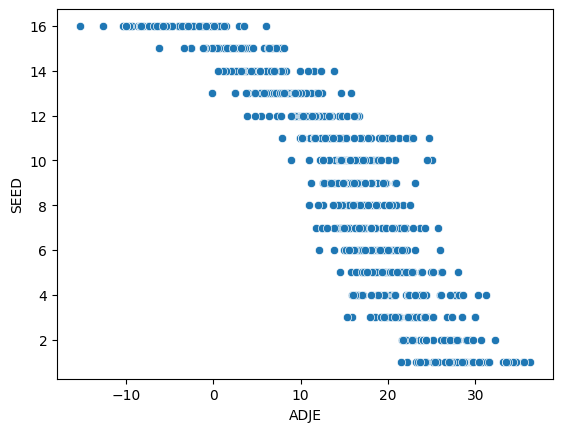

In [10]:
sns.scatterplot(cbb, x=cbb.ADJE, y=cbb.SEED)

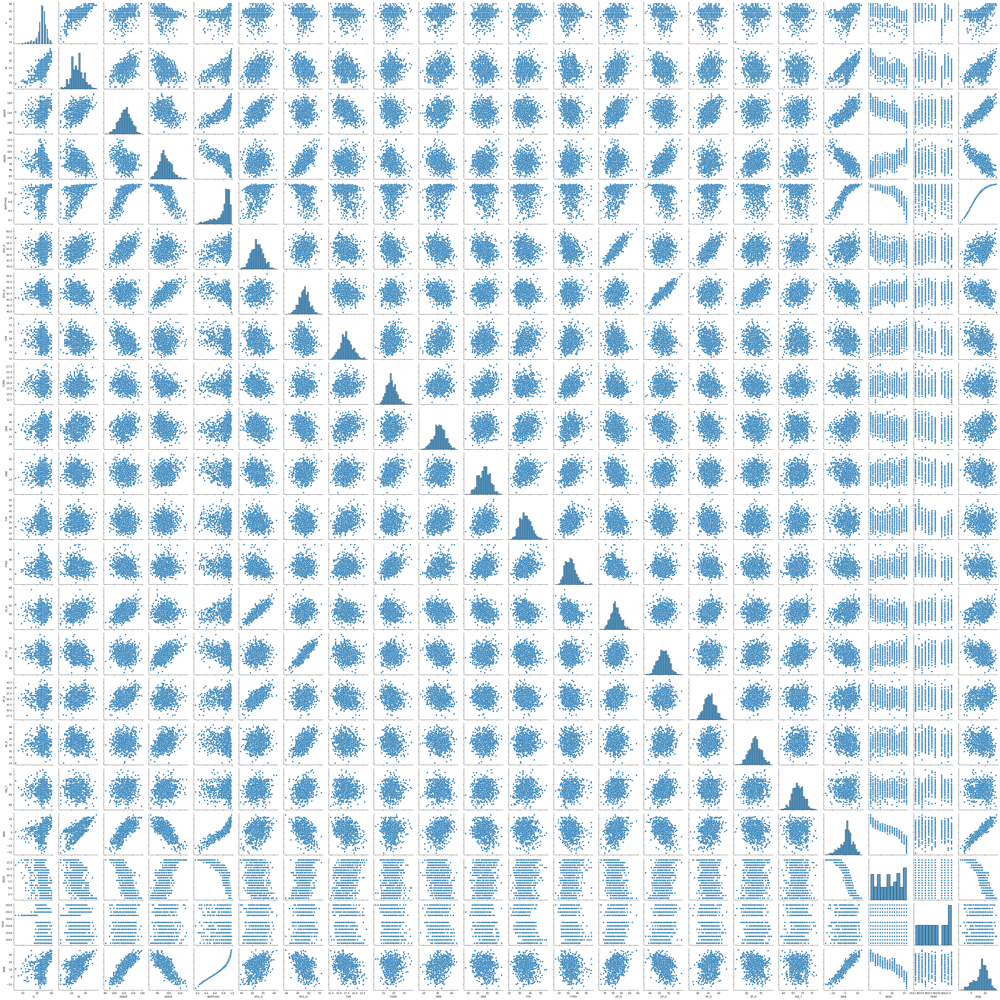

In [12]:
sns.pairplot(cbb)

# First Model

In my first model I tried to use what I knew from the notes to make a good BART model. I made one very big mistake though which caused the model to not end up being successful. As you can see I used ADJE as my X variable and Seed as my Y variable and used a Gamma distribution which I thought would be ok for my model.

In [11]:
features = ["ADJOE", "ADJDE"]
X = cbb['ADJE'].to_numpy().reshape(-1, 1)
Y = cbb["SEED"]

In [12]:
with pm.Model() as model_cbb:
    s = pm.HalfNormal('s',16)
    μ_ = pmb.BART("μ_", X, np.log(Y), m=16)
    μ = pm.Deterministic("μ",pm.math.exp(μ_))
    y = pm.Gamma("y", mu=μ, sigma=s,  observed=Y)
    idata_cbb = pm.sample(compute_convergence_checks=False)

Output()

In [13]:
pm.sample_posterior_predictive(idata_cbb, model_cbb, extend_inferencedata=True)

Output()

Inference data with groups:
	> posterior
	> posterior_predictive
	> sample_stats
	> observed_data

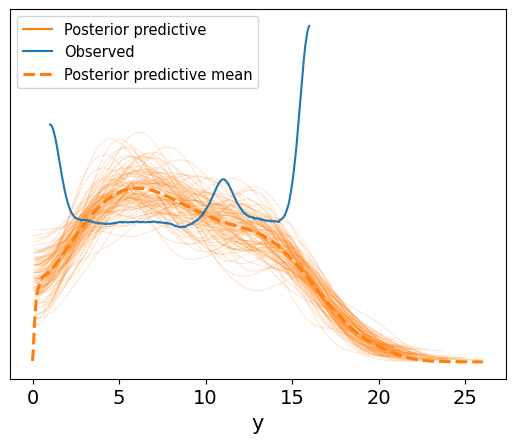

In [14]:
ax = az.plot_ppc(idata_cbb, num_pp_samples=100, colors=["C1", "C0", "C1"])

# Model 1 Conclusions

This model is very bad. The big mistake I made was not recognizing that Seed is a categorical variable so using the Gamma distribution messed everything up. I needed to make a second model which used a Categorical distribution.

In [15]:
_, seed = pd.factorize(cbb["SEED"], sort=True)
seed

Index([ 1.0,  2.0,  3.0,  4.0,  5.0,  6.0,  7.0,  8.0,  9.0, 10.0, 11.0, 12.0,
       13.0, 14.0, 15.0, 16.0],
      dtype='float64')

In [16]:
coords = {"n_obs": np.arange(len(X)), "seed": seed}

# Second Model

My second model performed a lot better because I used a Categorical distribution which matched the categorical nature of my y variable Seed.

In [17]:
with pm.Model(coords=coords) as model_cbbCat:
    μ = pmb.BART("μ", X, Y, m=50, dims=["seed", "n_obs"])
    θ = pm.Deterministic("θ", pm.math.softmax(μ, axis=0))
    y = pm.Categorical("y", p=θ.T, observed=Y)
    idata_cbbCat = pm.sample(compute_convergence_checks=False)

Output()

/usr/local/lib/python3.11/dist-packages/pymc_bart/pgbart.py:329: RuntimeWarning: invalid value encountered in 
subtract
  log_w_ = log_w - log_w_max

/usr/local/lib/python3.11/dist-packages/pymc_bart/pgbart.py:329: RuntimeWarning: invalid value encountered in 
subtract
  log_w_ = log_w - log_w_max

In [18]:
pm.sample_posterior_predictive(idata_cbbCat, model_cbbCat, extend_inferencedata=True)

Output()

Inference data with groups:
	> posterior
	> posterior_predictive
	> sample_stats
	> observed_data

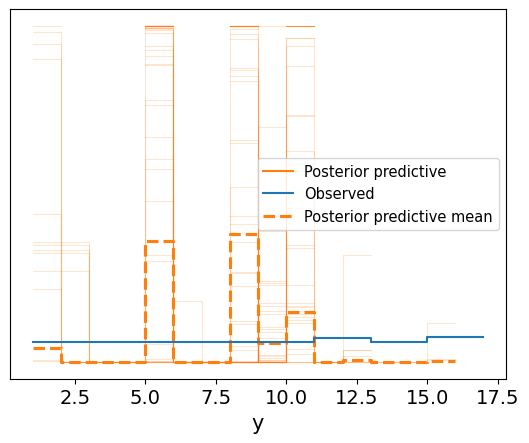

In [19]:
ax = az.plot_ppc(idata_cbbCat, num_pp_samples=100, colors=["C1", "C0", "C1"])

# Conclusion

As you can see above the model is very mediocre. It gets the overall trend of the data correct, but it has some spots that mess it up. I still haven't figured out whether this has something to do with the assumptions that I made with ADJE or something else. If you think about it ADJE might be a flawed peice of data because if you are only looking at teams who made the March Madness tournament they are all good teams with winning records meaning that they mostly have positive ADJE's meaning that we don't get to see the whole spectrum of the data. This model is useful for determining where a team might get seeded and seeing if a team will make the tournament at all.